In [1]:
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
import folium
import contextily as cx
import numpy as np

%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\osmnx\utils.py:192: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  warnings.warn(


'1.3.1.post0'

# Results
For all the below. The main graph needs to be loaded.

In [2]:
graph = ox.load_graphml('./results/criticalitygraph080723.graphml')
Segougraph = ox.load_graphml('./results/Segougraph080723.graphml')
Segougraphsmall = ox.load_graphml('./results/Segougraph100723.graphml')


In [3]:
incidents = pd.read_csv('./data/Africa_1997-2023_Apr21_2.csv', on_bad_lines='skip', sep=';')



---
## Segou Region

### Analysing Strategies

In [4]:
segougdf_nodes, segougdf_edges = ox.graph_to_gdfs(Segougraph)
segougdf_edges['criticality'] = segougdf_edges['criticality'].astype(float)

In [5]:
attackstrategysegou = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22582,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24933,0,0,0,0,0,0,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0,0,0)
defenderstratsegou = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0,0,0,0,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0,0,0]

In [6]:
a = {'col1': attackstrategysegou}
attackerdfsegou = pd.DataFrame(data=a)
d = {'col1': defenderstratsegou}
defenderdfsegou = pd.DataFrame(data=d)

In [7]:
#Find on which edges the strategy is focussing
defenderstratsegou = defenderdfsegou.loc[defenderdfsegou['col1'] != 0]
attackerstratsegou = attackerdfsegou.loc[attackerdfsegou['col1'] != 0]

In [8]:
print(defenderstratsegou)
print(attackerstratsegou)

        col1
27   0.21576
31   0.04835
32   0.05769
146  0.00135
155  0.34367
197  0.33318
        col1
27   0.14212
31   0.22582
32   0.22115
145  0.24933
154  0.07817
196  0.08341


In [9]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstratsegou = defenderstratsegou.reset_index(drop=False)
attackerstratsegou = attackerstratsegou.reset_index(drop=False)

strategydistributionsegou = segougdf_edges.reset_index()
strategydistributionsegou['defenderdistribution']=0
strategydistributionsegou['attackerdistribution']=0

for i in range(0, len(defenderstratsegou)):
    indexnr = defenderstratsegou.at[i,'index']
    percentage = defenderstratsegou.at[i,'col1']
    strategydistributionsegou.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegou)):
    indexnr = attackerstratsegou.at[j,'index']
    percentage = attackerstratsegou.at[j,'col1']
    strategydistributionsegou.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


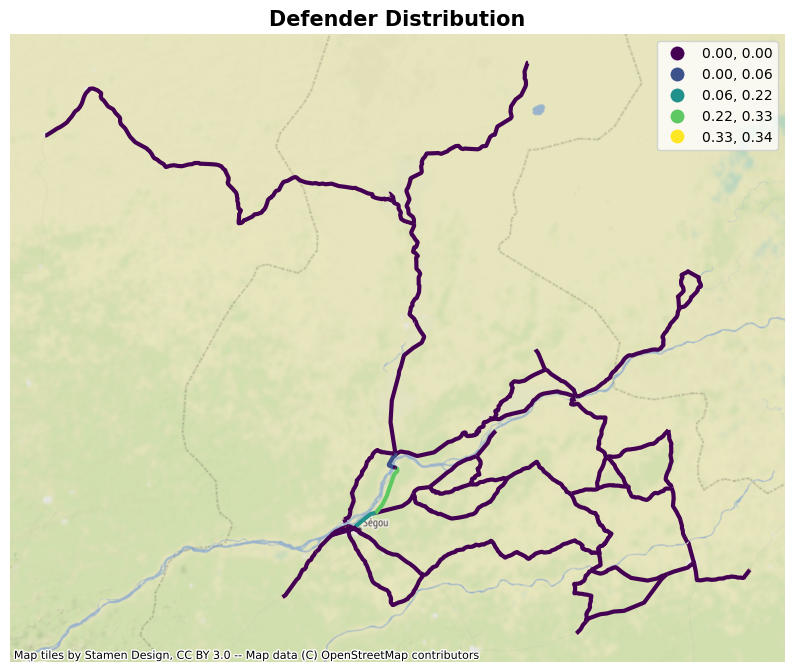

In [55]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegou.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='viridis', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegou.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


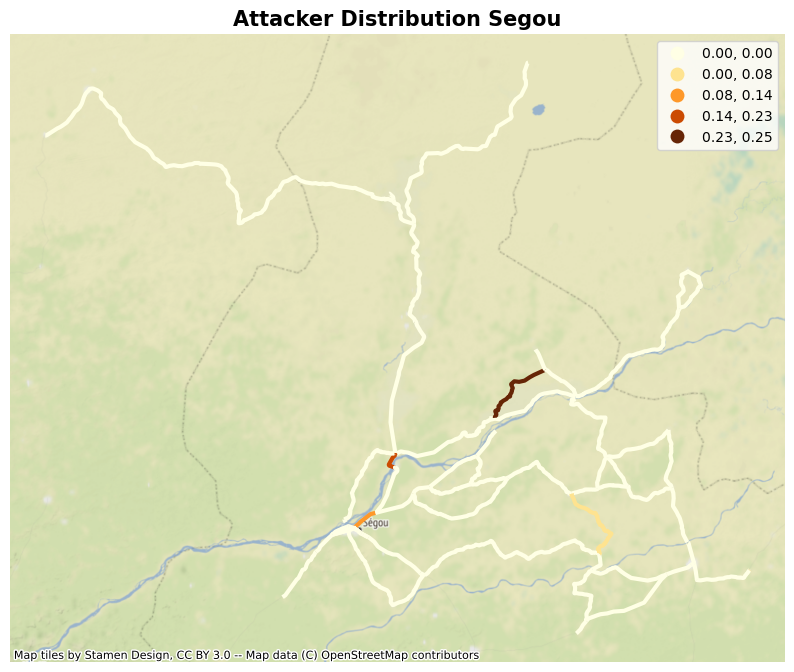

In [35]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegou.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegou.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\mapclassify\classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


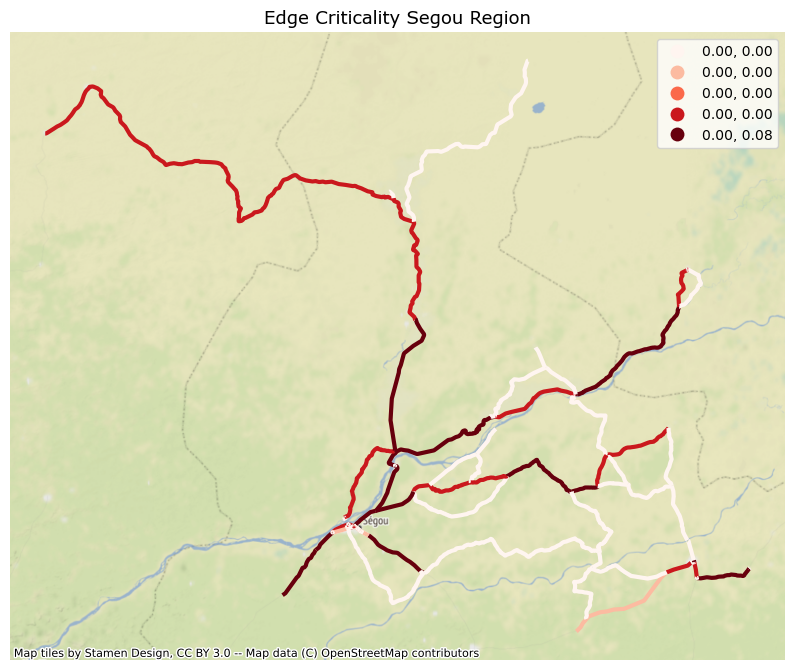

In [12]:
f, ax = plt.subplots(figsize=(10, 10))
segougdf_edges.plot(ax=ax, column='criticality', cmap='Reds', alpha=1, scheme='fisher_jenks_sampled', linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Edge Criticality Segou Region', font='Verdana', fontsize = 13)
cx.add_basemap(ax, crs=segougdf_edges.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


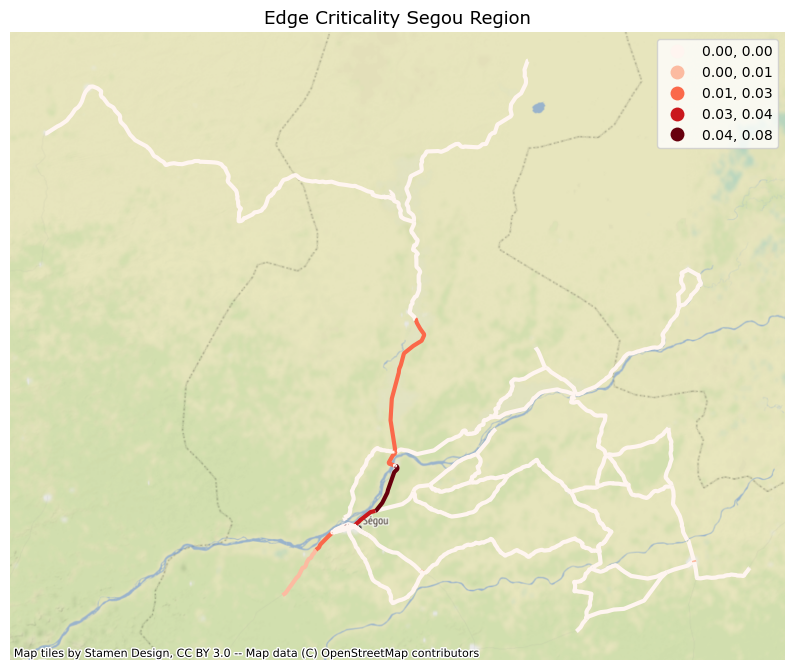

In [80]:
f, ax = plt.subplots(figsize=(10, 10))
segougdf_edges.plot(ax=ax, column='criticality', cmap='Reds', alpha=1, scheme='natural_breaks', linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Edge Criticality Segou Region', font='Verdana', fontsize = 13)
cx.add_basemap(ax, crs=segougdf_edges.crs.to_string())

plt.show()

---
### Analysis of Results * 10 000 000

In [101]:
v = gamematrixSegou * 1000000
v.to_csv('./results/gamematrixsegoux10000000100723.csv', header=None, index=None)

The value is -0.02485.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0)

In [102]:
defenderstratsegoux10 = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0)
attackstrategysegoux10= (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0)

In [103]:
a = {'col1': attackstrategysegoux10}
attackerdfsegoux10 = pd.DataFrame(data=a)
d = {'col1': defenderstratsegoux10}
defenderdfsegoux10 = pd.DataFrame(data=d)

In [104]:
#Find on which edges the strategy is focussing
defenderstratsegoux10 = defenderdfsegoux10.loc[defenderdfsegoux10['col1'] != 0]
attackerstratsegoux10 = attackerdfsegoux10.loc[attackerdfsegoux10['col1'] != 0]

In [105]:
print(defenderstratsegoux10)
print(attackerstratsegoux10)

        col1
17   0.21576
21   0.04835
22   0.05769
78   0.00135
81   0.34367
105  0.33318
        col1
17   0.14212
21   0.22583
22   0.22115
77   0.24932
80   0.07817
104  0.08341


In [106]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstratsegoux10 = defenderstratsegoux10.reset_index(drop=False)
attackerstratsegoux10 = attackerstratsegoux10.reset_index(drop=False)

strategydistributionsegoux10 = segougdf_edges.reset_index()
strategydistributionsegoux10['defenderdistribution']=0
strategydistributionsegoux10['attackerdistribution']=0

for i in range(0, len(defenderstratsegoux10)):
    indexnr = defenderstratsegoux10.at[i,'index']
    percentage = defenderstratsegoux10.at[i,'col1']
    strategydistributionsegoux10.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegoux10)):
    indexnr = attackerstratsegoux10.at[j,'index']
    percentage = attackerstratsegoux10.at[j,'col1']
    strategydistributionsegoux10.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


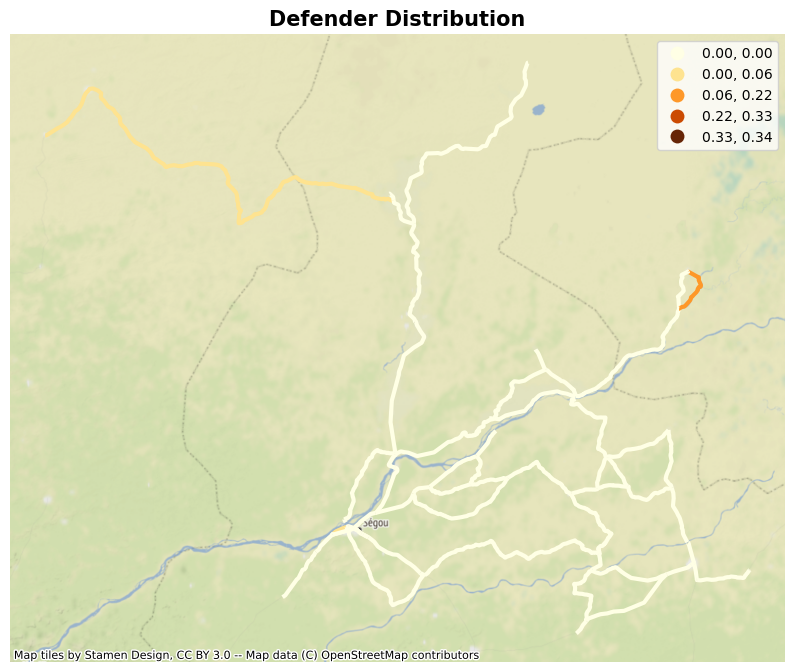

In [107]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoux10.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='YlOrBr', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoux10.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


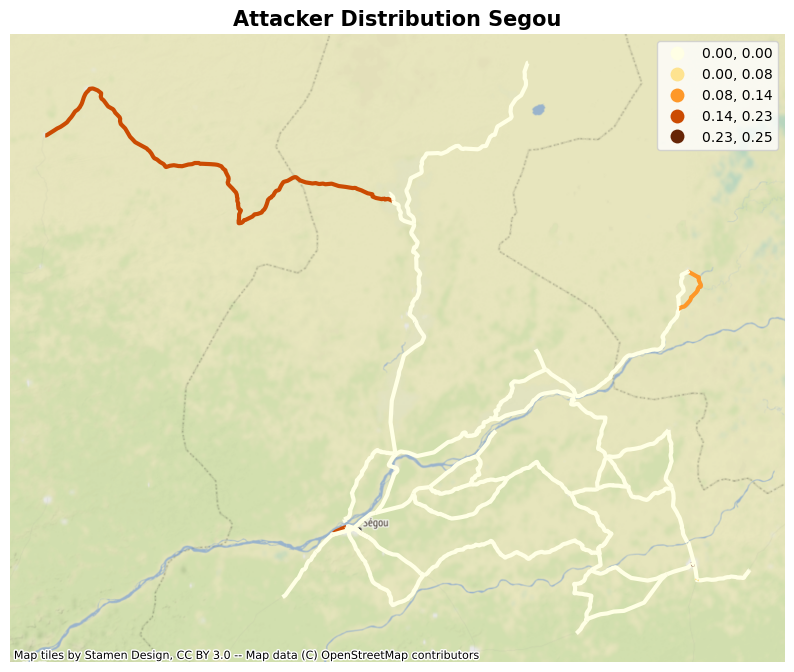

In [108]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoux10.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoux10.crs.to_string())

plt.show()

### What if we had deleted the streets with 0 criticality?

In [13]:
segougdf_nodes, segougdf_edges = ox.graph_to_gdfs(Segougraph)
segougdf_edges['criticality'] = segougdf_edges['criticality'].astype(float)


In [14]:
segougdf_criticaledges = segougdf_edges.loc[segougdf_edges['criticality'] != 0]
segougdf_criticaledges = segougdf_criticaledges.reset_index(drop=False)

In [15]:
nredges = len(segougdf_criticaledges)
gamematrix = pd.DataFrame(np.zeros([nredges, nredges])*np.nan)

#make a matrix with all the roads
for i in range(0, len(segougdf_criticaledges)):
    criticalityval = segougdf_criticaledges.criticality[i]
    gamematrix.iloc[:,i] = - criticalityval
    gamematrix.iloc[i,i] = criticalityval

In [ ]:
pd.DataFrame(gamematrix).to_csv("results/game_matrixSegouSOLcritical08072023.csv", header=None, index=None, sep=' ')

The value is -0.02485.


In [17]:
attackstrategysegoucrit = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24933,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0)
defenderstratsegoucrit = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0)

In [18]:
a = {'col1': attackstrategysegoucrit}
attackerdfsegoucrit = pd.DataFrame(data=a)
d = {'col1': defenderstratsegoucrit}
defenderdfsegoucrit = pd.DataFrame(data=d)

In [19]:
defenderstratsegoucrit = defenderdfsegoucrit.loc[defenderdfsegoucrit['col1'] != 0]
attackerstratsegoucrit = attackerdfsegoucrit.loc[attackerdfsegoucrit['col1'] != 0]

In [56]:
defenderstratsegoucrit

,level_0,index,col1
0,0,17,0.21576
1,1,21,0.04835
2,2,22,0.05769
3,3,78,0.00135
4,4,81,0.34367
5,5,105,0.33318


In [21]:
defenderstratsegoucrit = defenderstratsegoucrit.reset_index(drop=False)
attackerstratsegoucrit = attackerstratsegoucrit.reset_index(drop=False)

strategydistributionsegoucrit = segougdf_criticaledges
strategydistributionsegoucrit['defenderdistribution']=0
strategydistributionsegoucrit['attackerdistribution']=0

for i in range(0, len(defenderstratsegoucrit)):
    indexnr = defenderstratsegoucrit.at[i,'index']
    percentage = defenderstratsegoucrit.at[i,'col1']
    strategydistributionsegoucrit.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegoucrit)):
    indexnr = attackerstratsegoucrit.at[j,'index']
    percentage = attackerstratsegoucrit.at[j,'col1']
    strategydistributionsegoucrit.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


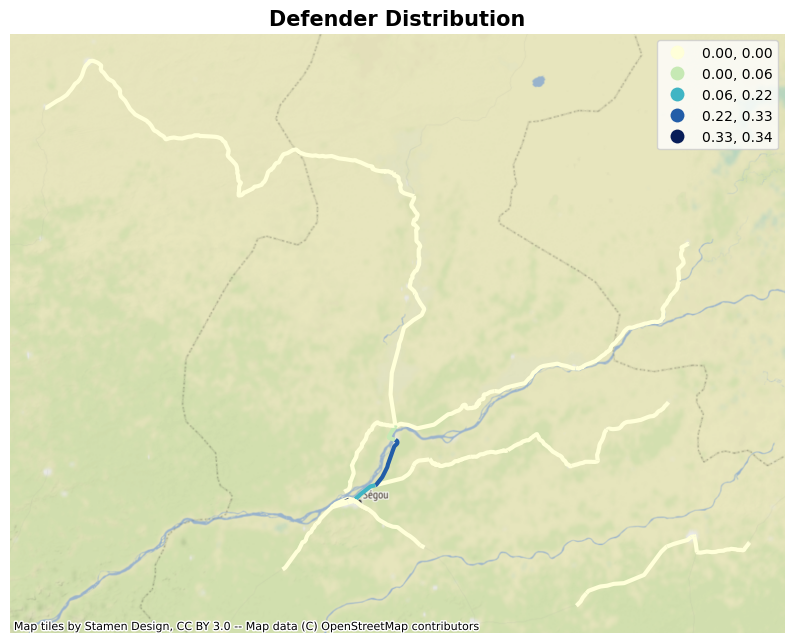

In [36]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoucrit.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='YlGnBu', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoucrit.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


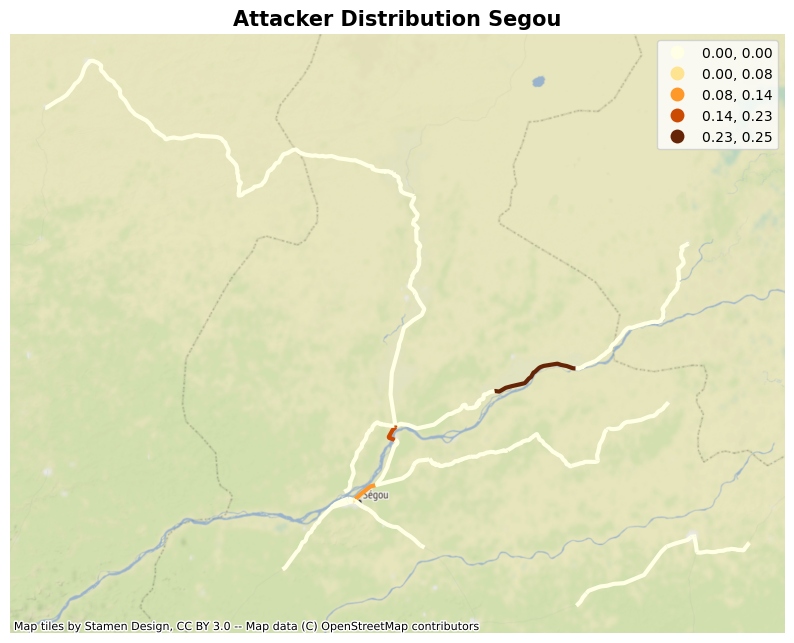

In [37]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoucrit.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoucrit.crs.to_string())

plt.show()

Results are exactly the same. This means we can make the matrix for the full thing smaller as well.

---
### Segou but smaller sliced

The value is -0.02485.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0,0,0,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0,0,0,0)

In [128]:
segousmallgdf_nodes, segousmallgdf_edges = ox.graph_to_gdfs(Segougraphsmall)
segousmallgdf_edges['criticality'] = segousmallgdf_edges['criticality'].astype(float)

In [129]:
defenderstratsegousmall = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0,0,0,0)
attackstrategysegousmall= (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0,0,0,0)

In [130]:
a = {'col1': attackstrategysegousmall}
attackerdfsegousmall = pd.DataFrame(data=a)
d = {'col1': defenderstratsegousmall}
defenderdfsegousmall = pd.DataFrame(data=d)

In [131]:
#Find on which edges the strategy is focussing
defenderstratsegousmall = defenderdfsegousmall.loc[defenderdfsegousmall['col1'] != 0]
attackerstratsegousmall = attackerdfsegousmall.loc[attackerdfsegousmall['col1'] != 0]

In [132]:
print(defenderstratsegousmall)
print(attackerstratsegousmall)

        col1
31   0.21576
35   0.04835
36   0.05769
151  0.00135
157  0.34367
202  0.33318
        col1
31   0.14212
35   0.22583
36   0.22115
150  0.24932
156  0.07817
201  0.08341


In [133]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstratsegousmall = defenderstratsegousmall.reset_index(drop=False)
attackerstratsegousmall = attackerstratsegousmall.reset_index(drop=False)

strategydistributionsegousmall = segousmallgdf_edges.reset_index()
strategydistributionsegousmall['defenderdistribution']=0
strategydistributionsegousmall['attackerdistribution']=0

for i in range(0, len(defenderstratsegousmall)):
    indexnr = defenderstratsegousmall.at[i,'index']
    percentage = defenderstratsegousmall.at[i,'col1']
    strategydistributionsegousmall.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegousmall)):
    indexnr = attackerstratsegousmall.at[j,'index']
    percentage = attackerstratsegousmall.at[j,'col1']
    strategydistributionsegousmall.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


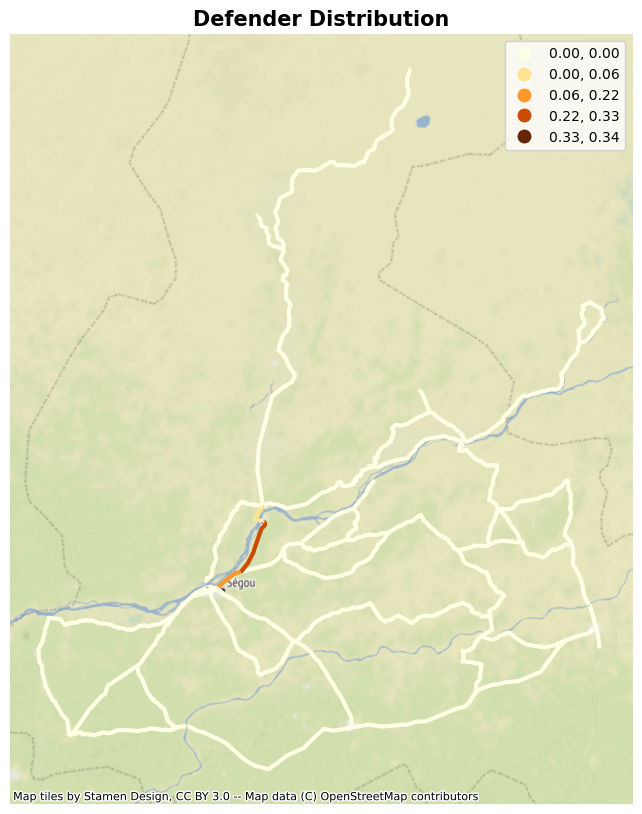

In [134]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegousmall.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='YlOrBr', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


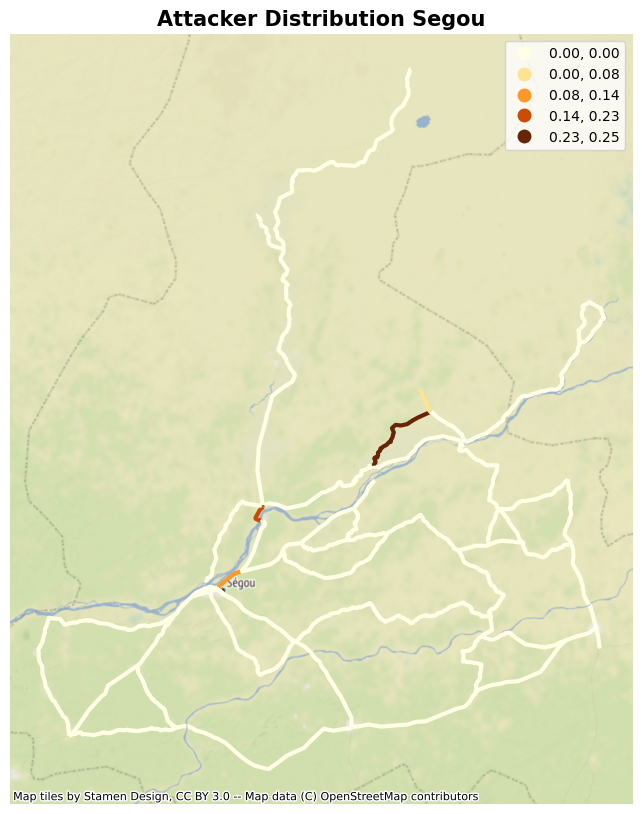

In [135]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegousmall.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())

plt.show()

---
### Smaller Segou *10 000 000

In [136]:
gamematrixSegousmall10 = pd.read_csv('./results/game_matrixSegou100720231400.csv', sep=' ', header=None)

In [137]:
v = gamematrixSegousmall10 * 1000000
v.to_csv('./results/gamematrixsegouxsmall10000000100723.csv', header=None, index=None)

The value is -0.02485.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0)

In [102]:
defenderstratsegoux10 = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21576,0,0,0,0.04835,0.05769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00135,0,0,0.34367,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33318,0)
attackstrategysegoux10= (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14212,0,0,0,0.22583,0.22115,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24932,0,0,0.07817,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08341,0)

In [103]:
a = {'col1': attackstrategysegoux10}
attackerdfsegoux10 = pd.DataFrame(data=a)
d = {'col1': defenderstratsegoux10}
defenderdfsegoux10 = pd.DataFrame(data=d)

In [104]:
#Find on which edges the strategy is focussing
defenderstratsegoux10 = defenderdfsegoux10.loc[defenderdfsegoux10['col1'] != 0]
attackerstratsegoux10 = attackerdfsegoux10.loc[attackerdfsegoux10['col1'] != 0]

In [105]:
print(defenderstratsegoux10)
print(attackerstratsegoux10)

        col1
17   0.21576
21   0.04835
22   0.05769
78   0.00135
81   0.34367
105  0.33318
        col1
17   0.14212
21   0.22583
22   0.22115
77   0.24932
80   0.07817
104  0.08341


In [106]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstratsegoux10 = defenderstratsegoux10.reset_index(drop=False)
attackerstratsegoux10 = attackerstratsegoux10.reset_index(drop=False)

strategydistributionsegoux10 = segougdf_edges.reset_index()
strategydistributionsegoux10['defenderdistribution']=0
strategydistributionsegoux10['attackerdistribution']=0

for i in range(0, len(defenderstratsegoux10)):
    indexnr = defenderstratsegoux10.at[i,'index']
    percentage = defenderstratsegoux10.at[i,'col1']
    strategydistributionsegoux10.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegoux10)):
    indexnr = attackerstratsegoux10.at[j,'index']
    percentage = attackerstratsegoux10.at[j,'col1']
    strategydistributionsegoux10.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


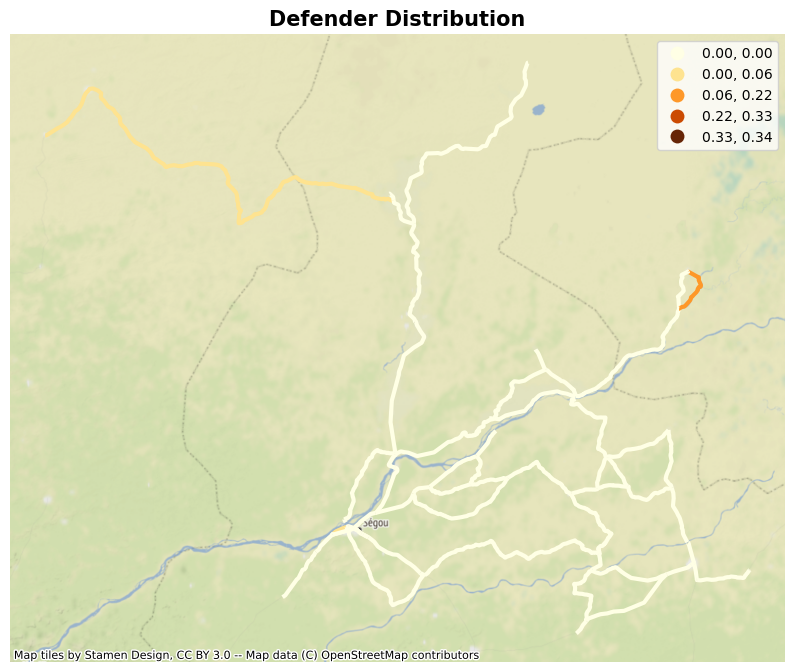

In [107]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoux10.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='YlOrBr', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoux10.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


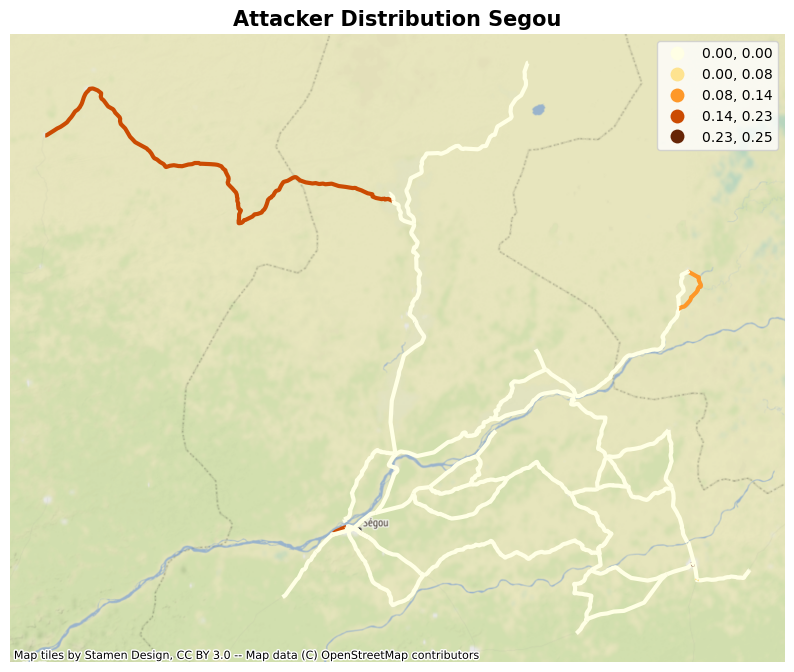

In [108]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegoux10.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegoux10.crs.to_string())

plt.show()

---
## Full COUNTRY

In [40]:
#take the edges and nodes out of the graph
gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph)
#reset edge index
edgecriticality = gdf_edges.reset_index()

#create ID numbers (TO DO later: make the rows and columns named like the ID numbers instead of normal numbers
edgecriticality['IDnr'] = np.nan

for i in range(0, len(edgecriticality)):
    string = 'id'
    edgecriticality.IDnr[i] = (string+str(i))

C:\Users\maaik\AppData\Local\Temp\ipykernel_83548\1293876534.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edgecriticality.IDnr[i] = (string+str(i))


In [41]:
len(edgecriticality)

1765

In [42]:
edgecriticality['criticality'] = edgecriticality['criticality'].astype(float)
edgecriticality = edgecriticality.loc[edgecriticality['criticality'] != 0]
edgecriticality = edgecriticality.reset_index(drop=False)
len(edgecriticality)

643

In [43]:
nredges = len(edgecriticality)
gamematrix = pd.DataFrame(np.zeros([nredges, nredges])*np.nan)

#make a matrix with all the roads
for i in range(0, len(edgecriticality)):
    criticalityval = edgecriticality.criticality[i]
    gamematrix.iloc[:,i] = - criticalityval
    gamematrix.iloc[i,i] = criticalityval

In [44]:
pd.DataFrame(gamematrix).to_csv("results/game_matrixMali080720232200.csv", header=None, index=None, sep=' ')

In [45]:
defenderstrat = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.26114,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24512,0,0.06571,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.03381,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.36041,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.03381,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
attackstrategy = (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.11943,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.12744,0,0.21714,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.2331,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0698,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.23309,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)

The value is -0.03796.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.26114,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.24512,0,0.06571,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.03381,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.36041,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.03381,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.11943,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.12744,0,0.21714,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.23309,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0698,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.23309,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)


In [46]:
a = {'col1': attackstrategy}
attackerdf = pd.DataFrame(data=a)
d = {'col1': defenderstrat}
defenderdf = pd.DataFrame(data=d)

In [47]:
#Find on which edges the strategy is focussing
defenderstrat = defenderdf.loc[defenderdf['col1'] != 0]
attackerstrat = attackerdf.loc[attackerdf['col1'] != 0]

In [48]:
print(defenderstrat)
print(attackerstrat)

        col1
22   0.26114
44   0.24512
46   0.06571
305  0.03381
360  0.36041
555  0.03381
        col1
22   0.11943
44   0.12744
46   0.21714
302  0.23310
356  0.06980
547  0.23309


In [49]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstrat = defenderstrat.reset_index(drop=False)
attackerstrat = attackerstrat.reset_index(drop=False)

strategydistribution = edgecriticality
strategydistribution['defenderdistribution']=0
strategydistribution['attackerdistribution']=0

for i in range(0, len(defenderstrat)):
    indexnr = defenderstrat.at[i,'index']
    percentage = defenderstrat.at[i,'col1']
    strategydistribution.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstrat)):
    indexnr = attackerstrat.at[j,'index']
    percentage = attackerstrat.at[j,'col1']
    strategydistribution.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


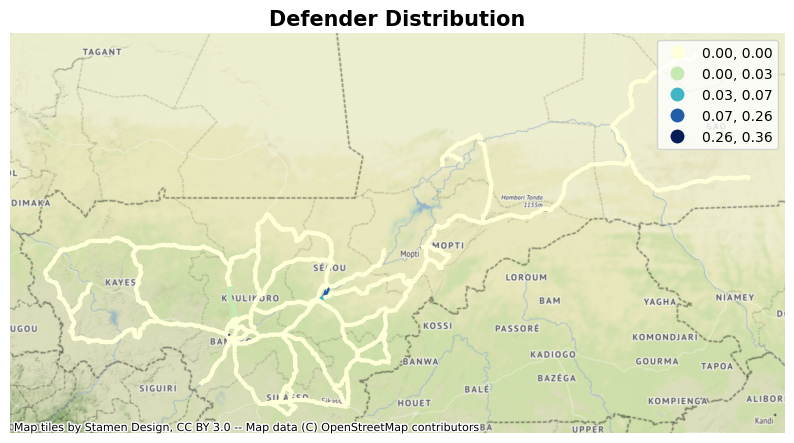

In [53]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistribution.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='YlGnBu', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistribution.crs.to_string())

plt.show()

In [51]:
strategydistribution

,index,u,v,key,osmid,highway,oneway,reversed,length,bridge,...,ref,name,lanes,junction,maxspeed,access,width,IDnr,defenderdistribution,attackerdistribution
0,0,504509824,505824314,0,"[41268816, 214787218, 41269211, 214787226]",primary,False,False,48681.697,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id0,0.0,0.0
1,1,504509824,2534916634,0,"[894523660, 246447439, 630217423, 246447443, 4...",secondary,False,"[False, True]",53546.744,NaN,...,RN30,NaN,NaN,NaN,NaN,NaN,NaN,id1,0.0,0.0
2,2,2456393854,505824314,0,"[572191905, 572191906, 321956592, 321956593, 3...",trunk,False,True,25790.558,yes,...,RN7,"[Route Trans-Sahélienne, TRoute rans-Sahélienne]",NaN,NaN,NaN,NaN,NaN,id2,0.0,0.0
3,3,2456393854,2534916634,0,"[572191817, 572205562, 339539188]",trunk,False,False,19797.290,yes,...,RN7,Route Trans-Sahélienne,NaN,NaN,NaN,NaN,NaN,id3,0.0,0.0
4,4,2456393854,2148961095,0,"[582062498, 582062499, 582062301, 423677690, 5...",secondary,False,"[False, True]",42692.201,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id4,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,1753,1042790212,504480451,0,"[219125218, 167413826, 202554341, 27927795, 23...",secondary,False,"[False, True]",85425.859,yes,...,NaN,Boulevard Askia Mohamed,NaN,NaN,NaN,NaN,NaN,id1753,0.0,0.0
639,1754,1042790212,3317746068,0,202554345,secondary,True,False,50.776,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id1754,0.0,0.0
640,1759,3317746067,3317746068,0,27927747,secondary,True,False,7.974,NaN,...,NaN,Plaza de la Independencia,NaN,roundabout,NaN,NaN,NaN,id1759,0.0,0.0
641,1760,504480451,2464415556,0,"[219125218, 167413835, 200833806, 424765074, 1...",secondary,False,False,37679.220,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,id1760,0.0,0.0


C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


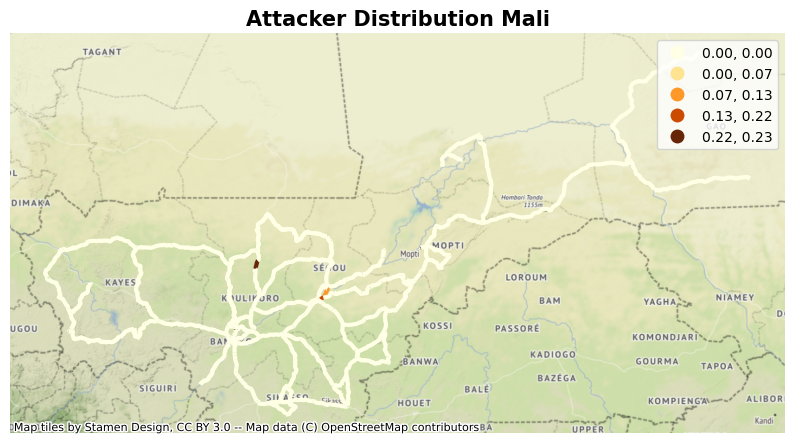

In [52]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistribution.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Mali', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistribution.crs.to_string())

plt.show()

TO DO: get the labels with the % of where to put which resources. 

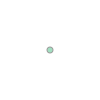

In [123]:
strategydistribution.at[15,'geometry'].centroid

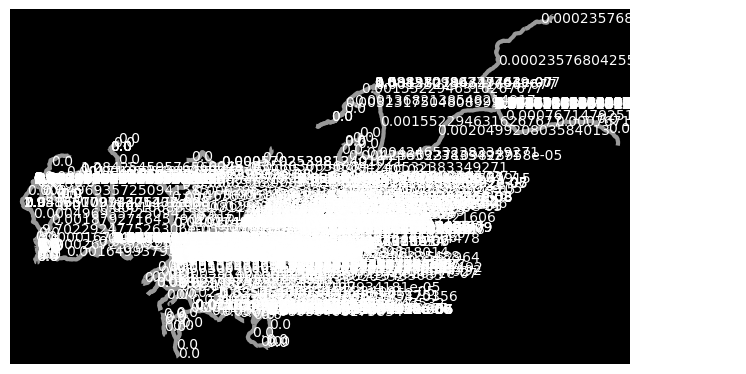

In [135]:
fig, ax = ox.plot_graph(graph, bgcolor='k', edge_linewidth=3, node_size=0,
                        show=False, close=False)
for _, edge in ox.graph_to_gdfs(graph, nodes=False).fillna('').iterrows():
    if edge['criticality']== 0:
        a = 2
    else:
        c = edge['geometry'].centroid
        text = edge['criticality']
        ax.annotate(text, (c.x, c.y), c='w')
plt.show()

In [136]:
c = strategydistribution['geometry'].centroid


C:\Users\maaik\AppData\Local\Temp\ipykernel_73600\2318970008.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  c = strategydistribution['geometry'].centroid


---
## Segou - Where criticality has only been calculated with regards to Segou


12/07/23 14:39
Based on game gamematrixCutSegoug1007231432
Graph: CutSegougraph1007231432.graphml
Criticality is however based on nationwide criticality

In [ ]:
The value is -0.609.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39185,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.30422,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.30392,0,0,0,0,0,0,0,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21629,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39155,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39216,0,0,0,0,0,0,0,0)

In [ ]:
The value is -0.02568.
An optimal strategy for Player I is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21952,0,0,0,0.08312,0.14097,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.03731,0,0,0,0,0,0,0,0,0,0.182,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.33707,0,0,0,0,0,0,0,0)
An optimal strategy for Player II is:
 (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.14024,0,0,0,0.20844,0.17951,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.23134,0,0,0,0,0,0,0,0,0,0.159,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.08146,0,0,0,0,0,0,0,0)

In [4]:
Segougraphsmall = ox.load_graphml('./results/SegouGraph1207231715.graphml')
#gamematrixSegou = pd.read_csv('./results/game_matrixSegou08072023.csv', sep=' ', header=None)

In [5]:
segousmallgdf_nodes, segousmallgdf_edges = ox.graph_to_gdfs(Segougraphsmall)
segousmallgdf_edges['criticality'] = segousmallgdf_edges['criticality'].astype(float)

In [6]:
defenderstratsegousmall =  (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39185,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.30422,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.30392,0,0,0,0,0,0,0,0)
attackstrategysegousmall=  (0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.21629,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39155,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.39216,0,0,0,0,0,0,0,0)

In [7]:
a = {'col1': attackstrategysegousmall}
attackerdfsegousmall = pd.DataFrame(data=a)
d = {'col1': defenderstratsegousmall}
defenderdfsegousmall = pd.DataFrame(data=d)

In [8]:
#Find on which edges the strategy is focussing
defenderstratsegousmall = defenderdfsegousmall.loc[defenderdfsegousmall['col1'] != 0]
attackerstratsegousmall = attackerdfsegousmall.loc[attackerdfsegousmall['col1'] != 0]

In [9]:
print(defenderstratsegousmall)
print(attackerstratsegousmall)

        col1
21   0.39185
142  0.30422
187  0.30392
        col1
21   0.21629
142  0.39155
187  0.39216


In [10]:
#Build a gdf with criticaltiy and both optimal strategies
defenderstratsegousmall = defenderstratsegousmall.reset_index(drop=False)
attackerstratsegousmall = attackerstratsegousmall.reset_index(drop=False)

strategydistributionsegousmall = segousmallgdf_edges.reset_index()
strategydistributionsegousmall['defenderdistribution']=0
strategydistributionsegousmall['attackerdistribution']=0

for i in range(0, len(defenderstratsegousmall)):
    indexnr = defenderstratsegousmall.at[i,'index']
    percentage = defenderstratsegousmall.at[i,'col1']
    strategydistributionsegousmall.at[indexnr,'defenderdistribution']=percentage

for j in range(0, len(defenderstratsegousmall)):
    indexnr = attackerstratsegousmall.at[j,'index']
    percentage = attackerstratsegousmall.at[j,'col1']
    strategydistributionsegousmall.at[indexnr,'attackerdistribution']=percentage

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\mapclassify\classifiers.py:1775: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(


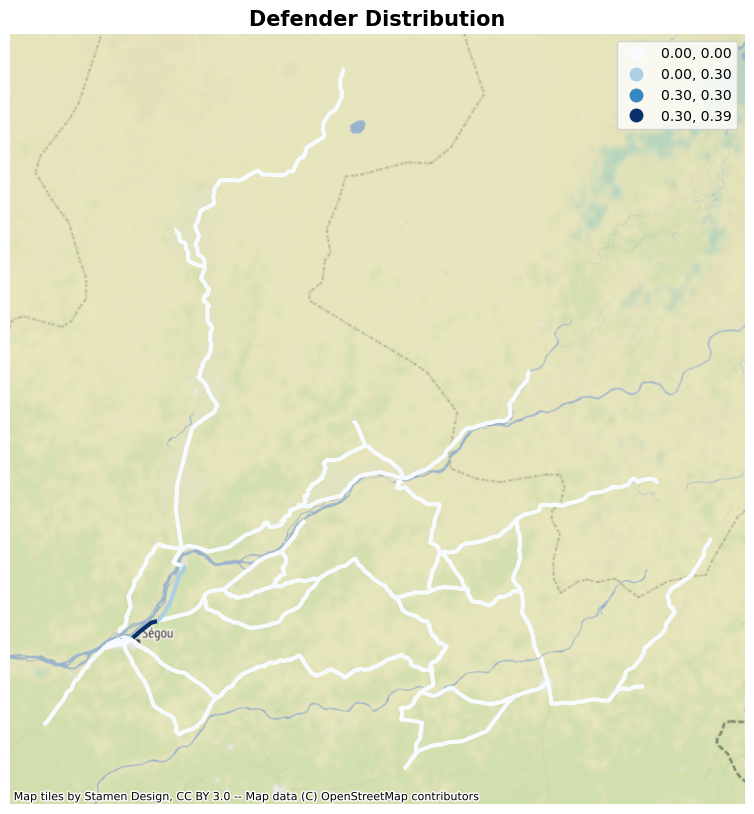

In [11]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegousmall.plot(ax=ax, column='defenderdistribution', scheme = 'natural_breaks', cmap='Blues', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Defender Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\mapclassify\classifiers.py:1775: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(


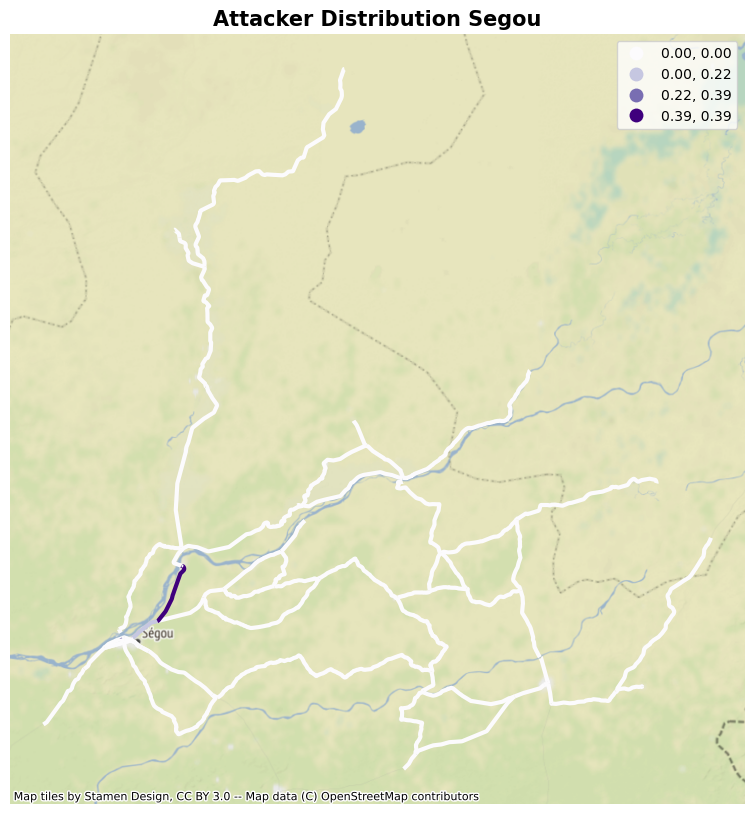

In [12]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegousmall.plot(ax=ax, column='attackerdistribution', cmap='Purples', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())


plt.show()

In [13]:
strategydistributionsegousmall

,u,v,key,osmid,oneway,name,highway,reversed,length,geometry,criticality,bridge,ref,lanes,junction,defenderdistribution,attackerdistribution
0,9372853264,2222343932,0,"[1061150372, 1061150373, 1057803463, 105780346...",True,Avenue de l'An 2000,primary,False,2313.210,"LINESTRING (-6.26126 13.43097, -6.25969 13.431...",0.000000,NaN,NaN,NaN,NaN,0.0,0.0
1,9372853264,8190645651,0,"[894160190, 444929633, 230159386, 1016169342]",True,Avenue de l'An 2000,primary,False,490.313,"LINESTRING (-6.24073 13.43680, -6.24032 13.436...",0.000000,yes,RN33;RN34,NaN,NaN,0.0,0.0
2,9372853264,8190645660,0,880596160,True,NaN,trunk_link,False,436.983,"LINESTRING (-6.24073 13.43680, -6.24027 13.436...",0.000000,NaN,NaN,NaN,NaN,0.0,0.0
3,348228117,2460280908,0,413904114,False,NaN,primary,True,6991.798,"LINESTRING (-5.32010 13.07242, -5.32029 13.072...",0.000000,NaN,RN6,NaN,NaN,0.0,0.0
4,4224507416,2222343850,0,31300316,True,Avenue de l'An 2000,primary,False,6681.039,"LINESTRING (-6.26299 13.43058, -6.26379 13.430...",0.000000,NaN,NaN,NaN,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,6074031576,5789656049,0,646465437,True,NaN,primary,False,28.485,"LINESTRING (-4.59217 13.28859, -4.59231 13.288...",0.000000,NaN,RN14,NaN,NaN,0.0,0.0
192,6074031579,5789656038,0,611551795,True,NaN,primary,False,14.425,"LINESTRING (-4.59213 13.28849, -4.59211 13.288...",0.000000,NaN,NaN,NaN,roundabout,0.0,0.0
193,6074031579,5789656042,0,611551798,True,NaN,primary,False,32.905,"LINESTRING (-4.59201 13.28847, -4.59193 13.288...",0.000000,NaN,RN14,NaN,NaN,0.0,0.0
194,5789656038,5789656049,0,646465439,True,NaN,primary,False,34.302,"LINESTRING (-4.59244 13.28857, -4.59231 13.288...",0.000000,NaN,RN14,NaN,NaN,0.0,0.0


In [14]:
#Put the defender and attacker distribution in the graph as attribute
edgesgdf = strategydistributionsegousmall.reset_index()
nredges = nx.number_of_edges(Segougraphsmall)

nx.set_node_attributes(Segougraphsmall, 0, "defenderdistribution")
nx.set_node_attributes(Segougraphsmall, 0, "attackerdistribution")

q = 0
for e in range (0, nredges):
    if edgesgdf.defenderdistribution[e] == 0:
        q = 0
    else:
        u = edgesgdf.u[e]
        v = edgesgdf.v[e]
        defenderdistribution = edgesgdf.defenderdistribution[e]
        nx.set_edge_attributes(Segougraphsmall,{(u,v,q):defenderdistribution}, 'defenderdistribution')
        
    if edgesgdf.attackerdistribution[e] == 0:
        q = 0
    else:
        u = edgesgdf.u[e]
        v = edgesgdf.v[e]
        attackerdistribution = edgesgdf.attackerdistribution[e]
        nx.set_edge_attributes(Segougraphsmall,{(u,v,q):attackerdistribution}, 'attackerdistribution')


options maps: https://ipyleaflet.readthedocs.io/en/latest/map_and_basemaps/basemaps.html

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


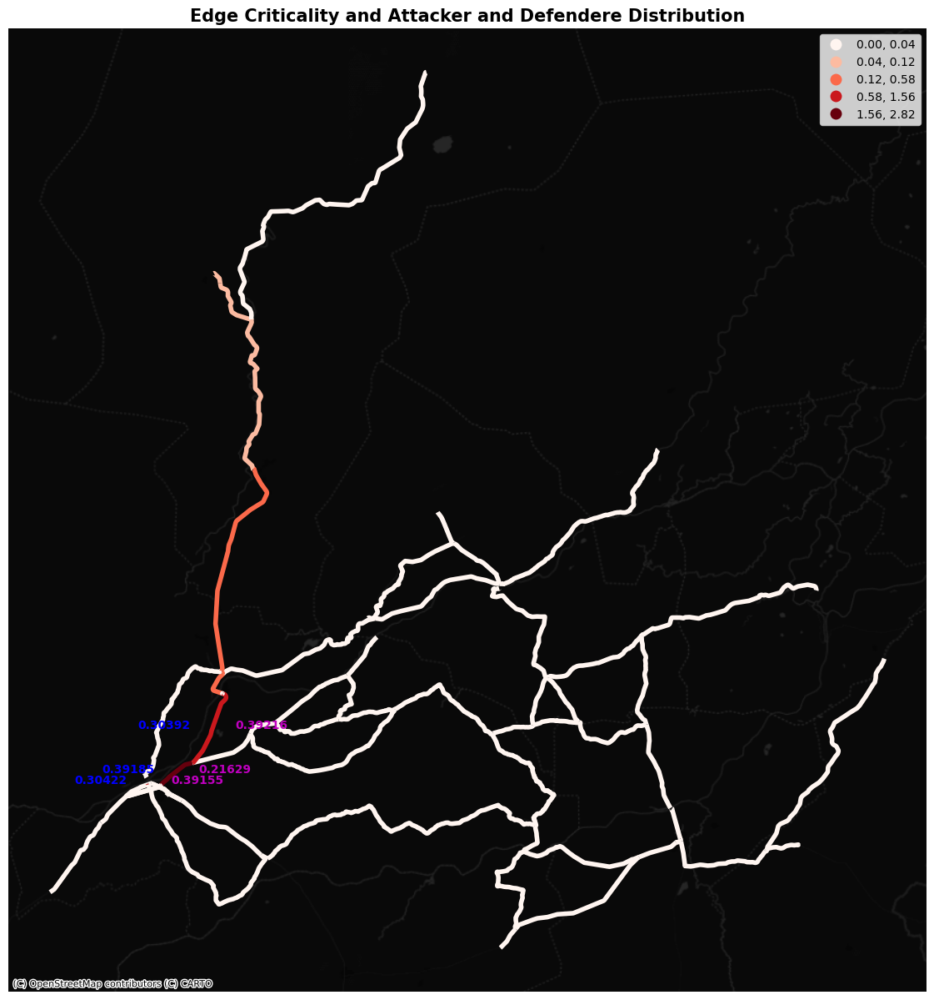

In [15]:
f, ax = plt.subplots(figsize=(15, 15))
strategydistributionsegousmall.plot(ax=ax, column='criticality', cmap='Reds', alpha=1, scheme='natural_breaks', linewidth=4, legend=True, zorder = 1)
#a.plot(ax=ax, c='w', alpha=0.9,  linewidth=0.2) #nodes

ax.set_axis_off()
ax.set_title('Edge Criticality and Attacker and Defendere Distribution', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string(), source=cx.providers.CartoDB.DarkMatterNoLabels)

for _, edge in ox.graph_to_gdfs(Segougraphsmall, nodes=False).fillna('').iterrows():
    c = edge['geometry'].centroid
    text = edge['defenderdistribution']
    #text = round(text, 3)
    if text == 0:
        text = 'nothing'
    else:
        text = str(text)
        ax.annotate(text, (c.x-0.19, c.y), c='b', fontweight ="bold")

for _, edge in ox.graph_to_gdfs(Segougraphsmall, nodes=False).fillna('').iterrows():
    c = edge['geometry'].centroid
    text = edge['attackerdistribution']
    #text = round(text, 3)
    if text == 0:
        text = 'nothing'
    else:
        text = str(text)
        ax.annotate(text, (c.x+0.06, c.y), c='m', zorder = 2, fontweight ="bold")

plt.show()

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


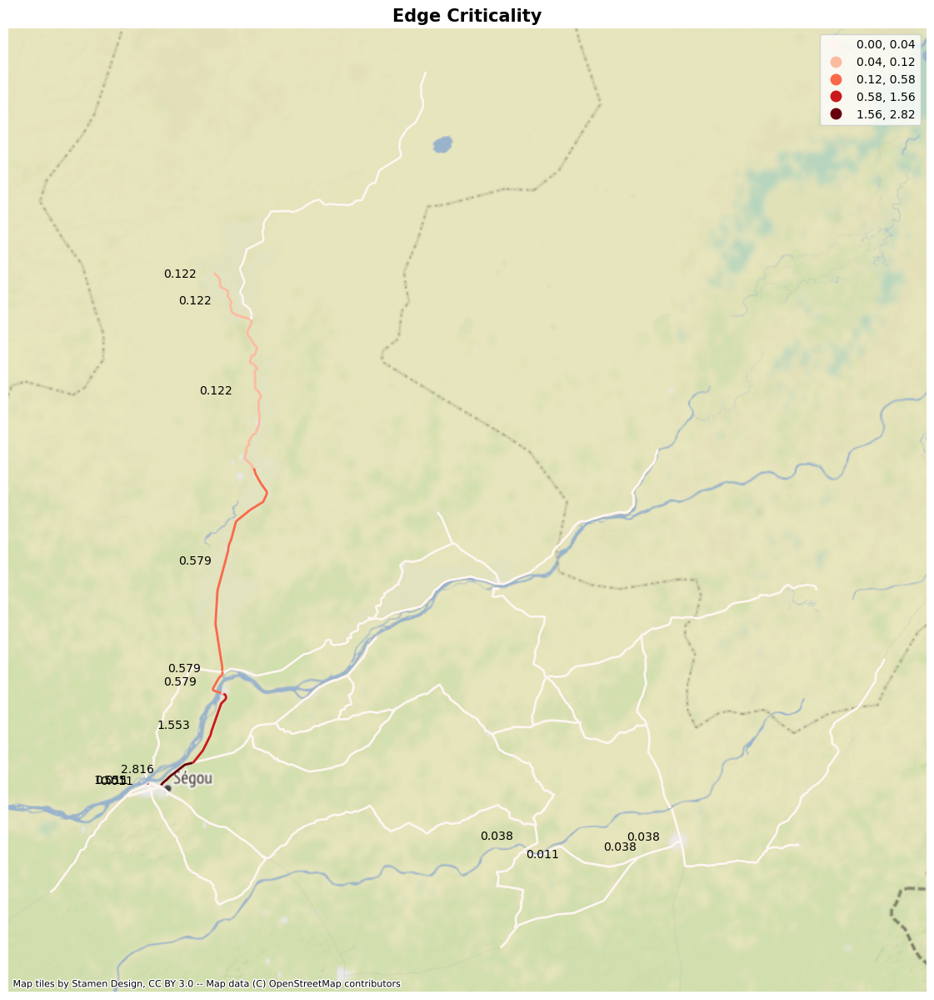

In [16]:
strategydistributionsegousmall['criticality'] = strategydistributionsegousmall['criticality'].astype(float)

f, ax = plt.subplots(figsize=(15, 15))
strategydistributionsegousmall.plot(ax=ax, column='criticality', cmap='Reds', alpha=1, scheme='natural_breaks', linewidth=2, legend=True)
#a.plot(ax=ax, c='w', alpha=0.9,  linewidth=0.2)

ax.set_axis_off()
ax.set_title('Edge Criticality', fontsize = 15, fontweight ="bold")
cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())

for _, edge in ox.graph_to_gdfs(Segougraphsmall, nodes=False).fillna('').iterrows():
    c = edge['geometry'].centroid
    text = float(edge['criticality'])
    text = round(text, 3)
    if text >0.01:
        text = str(text)
        ax.annotate(text, (c.x-0.14, c.y), c='k')

plt.show()


---
### Analysis of where attacks actually took place

In [25]:
incidentscleanded =incidents.loc[(incidents['COUNTRY']=='Mali') & (incidents['ADMIN1']=='Segou') & (incidents['DISORDER_TYPE']=='Political violence') & (incidents['YEAR']==2022)]
#'JNIM: Group for Support of Islam and Muslims'

In [26]:
#make floats of strings
incidentscleanded['LATITUDE'] = incidentscleanded['LATITUDE'].str.replace(',', '.').astype(float)
incidentscleanded['LONGITUDE'] = incidentscleanded['LONGITUDE'].str.replace(',', '.').astype(float)

C:\Users\maaik\AppData\Local\Temp\ipykernel_17780\1140062365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidentscleanded['LATITUDE'] = incidentscleanded['LATITUDE'].str.replace(',', '.').astype(float)
C:\Users\maaik\AppData\Local\Temp\ipykernel_17780\1140062365.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidentscleanded['LONGITUDE'] = incidentscleanded['LONGITUDE'].str.replace(',', '.').astype(float)


In [27]:
incidentscleanded = gpd.GeoDataFrame(
    incidentscleanded, geometry=gpd.points_from_xy(incidentscleanded.LONGITUDE, incidentscleanded.LATITUDE), crs="EPSG:4326"
)

In [33]:
incidentsIED = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Remote explosive/landmine/IED')]
incidentsArmCl = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Armed clash')]
incidentsAbd = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Abduction/forced disappearance')]
incidentsAtt = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Attack')]
incidentsSuicB = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Suicide bomb')]
incidentsArtil = incidentscleanded.loc[(incidents['SUB_EVENT_TYPE']=='Shelling/artillery/missile attack')]

C:\Users\maaik\miniconda3\envs\ox\lib\site-packages\mapclassify\classifiers.py:1775: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(


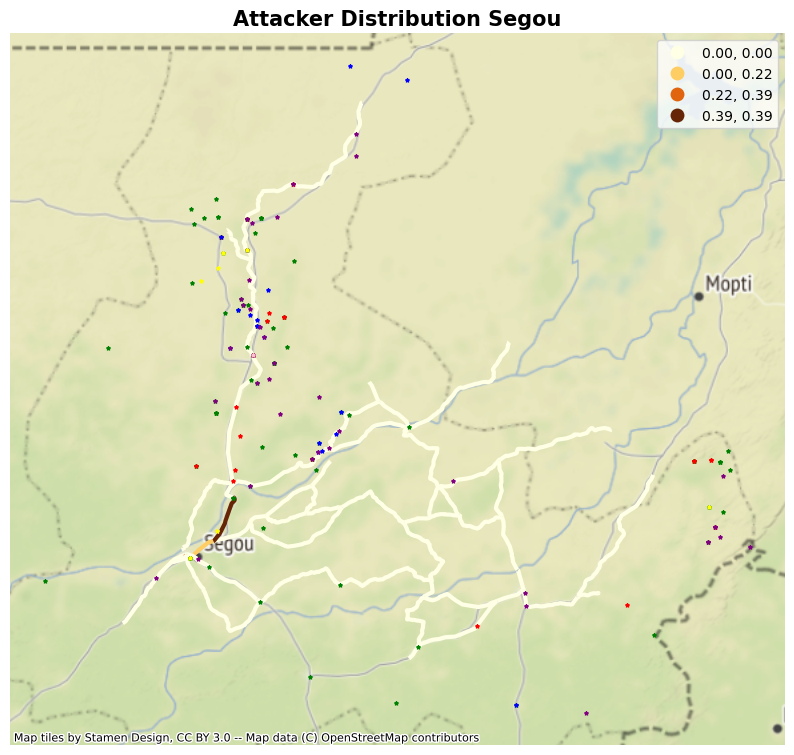

In [36]:
f, ax = plt.subplots(figsize=(10, 10))
strategydistributionsegousmall.plot(ax=ax, column='attackerdistribution', cmap='YlOrBr', scheme = 'natural_breaks', alpha=1, linewidth=3, legend=True, zorder=1)
ax.set_axis_off()
ax.set_title('Attacker Distribution Segou', fontsize = 15, fontweight ="bold")
incidentsArmCl.plot(ax=ax,marker='*', color='green', markersize=7, zorder=2);
incidentsIED.plot(ax=ax,marker='*', color='red', markersize=7, zorder=2);
incidentsAbd.plot(ax=ax,marker='*', color='blue', markersize=7, zorder=2);
incidentsAtt.plot(ax=ax,marker='*', color='purple', markersize=7, zorder=2);
incidentsSuicB.plot(ax=ax,marker='*', color='pink', markersize=7, zorder=2);
incidentsArtil.plot(ax=ax,marker='*', color='yellow', markersize=7, zorder=2);

cx.add_basemap(ax, crs=strategydistributionsegousmall.crs.to_string())

plt.show()


In [42]:
graphwithincidents = Segougraphsmall.copy()
incidents = incidentscleanded.reset_index()
segousmallgdf_edges["Incident_count"]=0

for i in range(0, len(incidents)):
    incidenty = incidents.LATITUDE[i]
    incidentx = incidents.LONGITUDE[i]
    # Get from/to id of closest edge
    (f, t, key), distance = ox.distance.nearest_edges(graphwithincidents,incidentx,incidenty, return_dist=True)
    print(distance)
    nx.set_edge_attributes(graphwithincidents, {osmidnr:populationnr}, 'Incident_count')
    



In [48]:
segousmallgdf_edges.loc[f,t]

C:\Users\maaik\AppData\Local\Temp\ipykernel_17780\408578683.py:1: PerformanceWarning: indexing past lexsort depth may impact performance.
  segousmallgdf_edges.loc[f,t]


,osmid,oneway,name,highway,reversed,length,geometry,criticality,bridge,ref,lanes,junction
key,,,,,,,,,,,,
0,"[445569280, 65423896, 204146716, 204146717, 20...",False,"[Route de Niono Diabaly, Route de Niono]",primary,True,63931.024,"LINESTRING (-6.07779 13.73679, -6.07772 13.737...",0.579262,yes,RN33,NaN,NaN


In [54]:
segousmallgdf_edges.at[(4224507416, 2222343850),'length']

ValueError: operands could not be broadcast together with shapes (2,) (3,) (2,) 

In [41]:
distance

0.07010431604561432

In [ ]:

    
    c = closestnode # Id of new node, c as in 'center

    edge_attrs = finalgraph.get_edge_data(f,t,key)
    finalgraph.remove_edge(f, t) # Remove edge from graph
    finalgraph.add_node(c, x= cityx, y= cityy, street_count = 2)
    distancefc = get_euclidean_distance(f,c, finalgraph)
    distancect = get_euclidean_distance(c,t, finalgraph)
    # Add new edges, recalculating atttributes as required
    
    finalgraph.add_edge(f, c, **{**edge_attrs, 'length': distancefc})
    finalgraph.add_edge(c, t, **{**edge_attrs, 'length': distancect})

In [37]:
incidentscleanded

,EVENT_ID_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,DISORDER_TYPE,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,INTER1,...,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TAGS,TIMESTAMP,geometry
124412,MLI6048,06-januari-2022,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NTR,2,...,14.253,-5.993,2,Radio Guintan; Signal; Twitter,New media-National,"On 6 January 2022, JNIM militants ambushed a M...",0,NTR,1680570424,POINT (-5.99300 14.25300)
124426,MLI6052,12-januari-2022,2022,2,Political violence,Violence against civilians,Attack,Katiba Macina,JNIM: Group for Support of Islam and Muslims,2,...,14.480,-6.040,2,Twitter,New media,"Around 12 January 2022 (week of), Katiba Macin...",1,NTR,1680570425,POINT (-6.04000 14.48000)
124456,MLI6098,14-januari-2022,2022,1,Political violence,Battles,Armed clash,Military Forces of Mali (2021-),NTR,1,...,14.810,-5.958,2,FAMAMali,National,"On 14 January 2022, the Malian army and (presu...",0,NTR,1643040848,POINT (-5.95800 14.81000)
124458,MLI6108,14-januari-2022,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NTR,2,...,14.888,-6.141,2,Signal,New media,"On 14 January 2022, presumed JNIM militants at...",1,NTR,1643040848,POINT (-6.14100 14.88800)
124459,MLI6374,14-januari-2022,2022,1,Political violence,Violence against civilians,Attack,Military Forces of Mali (2021-),Wagner Group,1,...,14.680,-6.016,2,HRW,Other,"On 14 January 2022, Malian soldiers accompanie...",5,NTR,1647888806,POINT (-6.01600 14.68000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126241,MLI7892,14-december-2022,2022,1,Political violence,Violence against civilians,Attack,JNIM: Group for Support of Islam and Muslims,NTR,2,...,13.859,-5.729,1,Studio Tamani; Twitter; Undisclosed Source,Local partner-Other,"On 14 December 2022, JNIM militants killed a D...",1,NTR,1673307074,POINT (-5.72900 13.85900)
126247,MLI7895,15-december-2022,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NTR,2,...,14.012,-5.604,1,Undisclosed Source,Local partner-Other,"On 15 December 2022, JNIM militants and Donso ...",5,NTR,1673307074,POINT (-5.60400 14.01200)
126249,MLI7897,16-december-2022,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NTR,2,...,13.619,-4.088,2,Facebook; Mouvement ATEM; Undisclosed Source,Local partner-Other,"On 16 December 2022, presumed JNM militants am...",8,NTR,1673307074,POINT (-4.08800 13.61900)
126254,MLI7901,17-december-2022,2022,1,Political violence,Battles,Armed clash,JNIM: Group for Support of Islam and Muslims,NTR,2,...,14.019,-6.141,1,Twitter,New media,"On 17 December 2022, Katiba Macina (JNIM) mili...",1,NTR,1673307074,POINT (-6.14100 14.01900)


In [31]:
Segougraphsmall.is_directed()

False